In [1]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
def padding(img, color='white', padding=5):
    channel_list = [img[:, :, i] for i in range(3)]
    if color == 'red':
        for i in range(len(channel_list)):
            if i == 0:
                channel_list[i] = np.pad(channel_list[i], ((padding, padding), (padding, padding)),
                                         'constant', constant_values=255)
            else:
                channel_list[i] = np.pad(channel_list[i], ((padding, padding), (padding, padding)),
                                         'constant', constant_values=0)

    elif color == 'green':
        for i in range(len(channel_list)):
            if i == 1:
                channel_list[i] = np.pad(channel_list[i], ((padding, padding), (padding, padding)),
                                         'constant', constant_values=255)
            else:
                channel_list[i] = np.pad(channel_list[i], ((padding, padding), (padding, padding)),
                                         'constant', constant_values=0)

    else:
        for i in range(len(channel_list)):
            channel_list[i] = np.pad(channel_list[i], ((padding, padding), (padding, padding)),
                                     'constant', constant_values=255)

    return np.stack(channel_list, axis=2)

In [3]:
def euclidean_distances(x, y, squared=True):
    x_square = np.expand_dims(np.einsum('ij, ij->i', x, x), axis=1)
    y_square = np.expand_dims(np.einsum('ij, ij->i', y, y), axis=0)

    distances = np.dot(x, y.T)
    distances *= -2
    distances += x_square
    distances += y_square
    np.maximum(distances, 0, distances)
    np.sqrt(distances, distances)
    return distances

In [4]:
def partition_arg_topK(matrix, K, axis=0):
    a_part = np.argpartition(matrix, K, axis=axis)
    if axis ==0 :
        row_index = np.arange(matrix.shape[1-axis])
        a_sec_argsort_K = np.argsort(matrix[a_part[0:K, :], row_index], axis=axis)
        return a_part[0:K, :][a_sec_argsort_K, row_index]
    else:
        column_index = np.arange(matrix.shape[1-axis])[:, None]
        a_sec_argsort_K = np.argsort(matrix[column_index, a_part[:, 0:K]], axis=axis)
        return a_part[:, 0:K][column_index, a_sec_argsort_K]

In [5]:
FEATURE_ROOT = '/data1/zzl/ICCV/features/rnd_mix_edge/shoev1/'

In [29]:
FEATURE_ROOT = '/data1/zzl/ICCV/features/rnd_mix_edge/chair/'

In [30]:
PHOTO_FEATURE = os.path.join(FEATURE_ROOT, 'photo.pkl')
SKETCH_FEATURE = os.path.join(FEATURE_ROOT, 'sketch.pkl')

In [31]:
photo_data = pickle.load(open(PHOTO_FEATURE, 'rb'))
sketch_data = pickle.load(open(SKETCH_FEATURE, 'rb'))

In [32]:
photo_name, photo_feature = photo_data['name'], photo_data['feature']
sketch_name, sketch_feature = sketch_data['name'], sketch_data['feature']

In [33]:
distances = euclidean_distances(sketch_feature, photo_feature)

In [34]:
gt_list = list(range(len(photo_name)))

In [35]:
len(photo_name)

97

In [36]:
gt_list = np.asarray(gt_list)

In [37]:
test_item = len(gt_list)

In [38]:
gt_list = np.reshape(gt_list, (test_item, 1))

In [39]:
topK = partition_arg_topK(distances, 10, axis=1)

In [40]:
recall_1 = topK[:, 0, None] == gt_list

In [41]:
np.mean(recall_1)

0.9484536082474226

In [42]:
negative_index = np.where(recall_1==False)

In [43]:
positive_index = np.where(recall_1==True)

In [52]:
selected_negative = np.random.choice(negative_index[0], size=4, replace=False)

In [53]:
selected_positive = np.random.choice(positive_index[0], size=6, replace=False)

In [46]:
PHOTO_ROOT = '/data1/zzl/dataset/sbir_cvpr2016/sbir_cvpr2016_release/sbir_cvpr2016/chairs/test/images/'
SKETCH_ROOT = '/data1/zzl/dataset/sbir_cvpr2016/sbir_cvpr2016_release/sbir_cvpr2016/chairs/test/sketches/'

In [22]:
PHOTO_ROOT = '/data1/zzl/dataset/sbir_cvpr2016/sbir_cvpr2016_release/sbir_cvpr2016/shoes/test/images/'
SKETCH_ROOT = '/data1/zzl/dataset/sbir_cvpr2016/sbir_cvpr2016_release/sbir_cvpr2016/shoes/test/sketches/'

In [47]:
sketch_name[selected_positive[0]]

'246.png'

In [54]:
result_img = None
for i, pos_index in enumerate(selected_positive):
    query_name = sketch_name[pos_index]
    query_img = Image.open(os.path.join(SKETCH_ROOT, query_name))
    query_img = np.asarray(query_img)
    print(np.shape(query_img))
    query_img = padding(query_img)
    
    matched_index = topK[pos_index]
    gt = gt_list[pos_index][0]
    for j in matched_index:
        matched_name = photo_name[j]
        matched_img = Image.open(os.path.join(PHOTO_ROOT, matched_name))
        matched_img = np.asarray(matched_img)
        if j == gt:
            matched_img = padding(matched_img, color='red')
        else:
            matched_img = padding(matched_img)
        query_img = np.append(query_img, matched_img, axis=1)
    print(np.shape(query_img))
    if i == 0:
        result_img = query_img
    else:
        result_img = np.append(result_img, query_img, axis=0)

(256, 256, 4)
(266, 2926, 3)
(256, 256, 4)
(266, 2926, 3)
(256, 256, 4)
(266, 2926, 3)
(256, 256, 4)
(266, 2926, 3)
(256, 256, 4)
(266, 2926, 3)
(256, 256, 4)
(266, 2926, 3)


In [29]:
read_img = Image.open('./quml_chair_result.png')

In [30]:
result_img = np.asarray(read_img)

In [55]:
for i, neg_index in enumerate(selected_negative):
    query_name = sketch_name[neg_index]
    query_img = Image.open(os.path.join(SKETCH_ROOT, query_name))
    query_img = np.asarray(query_img)
    query_img = padding(query_img)
    
    matched_index = topK[neg_index]
    gt = gt_list[neg_index][0]
    for j in matched_index:
        matched_name = photo_name[j]
        matched_img = Image.open(os.path.join(PHOTO_ROOT, matched_name))
        matched_img = np.asarray(matched_img)
        if j == gt:
            matched_img = padding(matched_img, color='red')
        else:
            matched_img = padding(matched_img)
        query_img = np.append(query_img, matched_img, axis=1)
    result_img = np.append(result_img, query_img, axis=0)

In [56]:
vis_result = Image.fromarray(result_img)

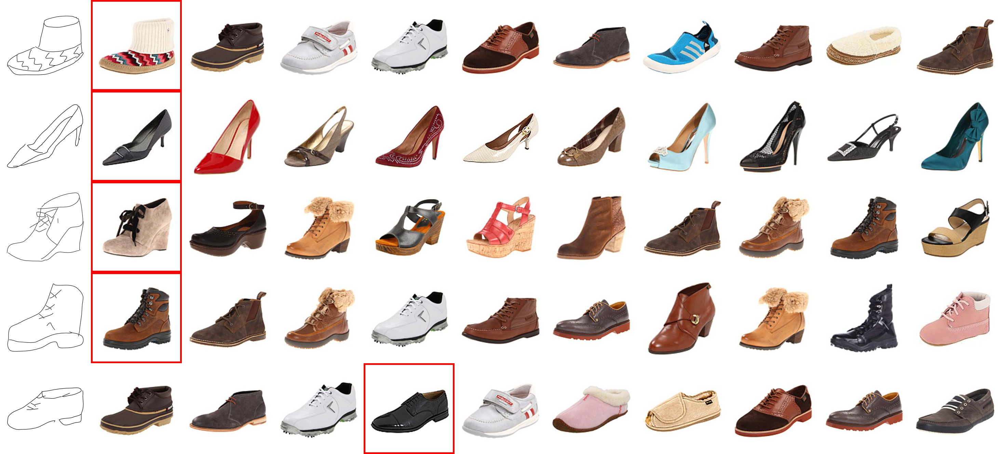

In [27]:
vis_result

In [28]:
vis_result.save('quml_shoev1_result.png')

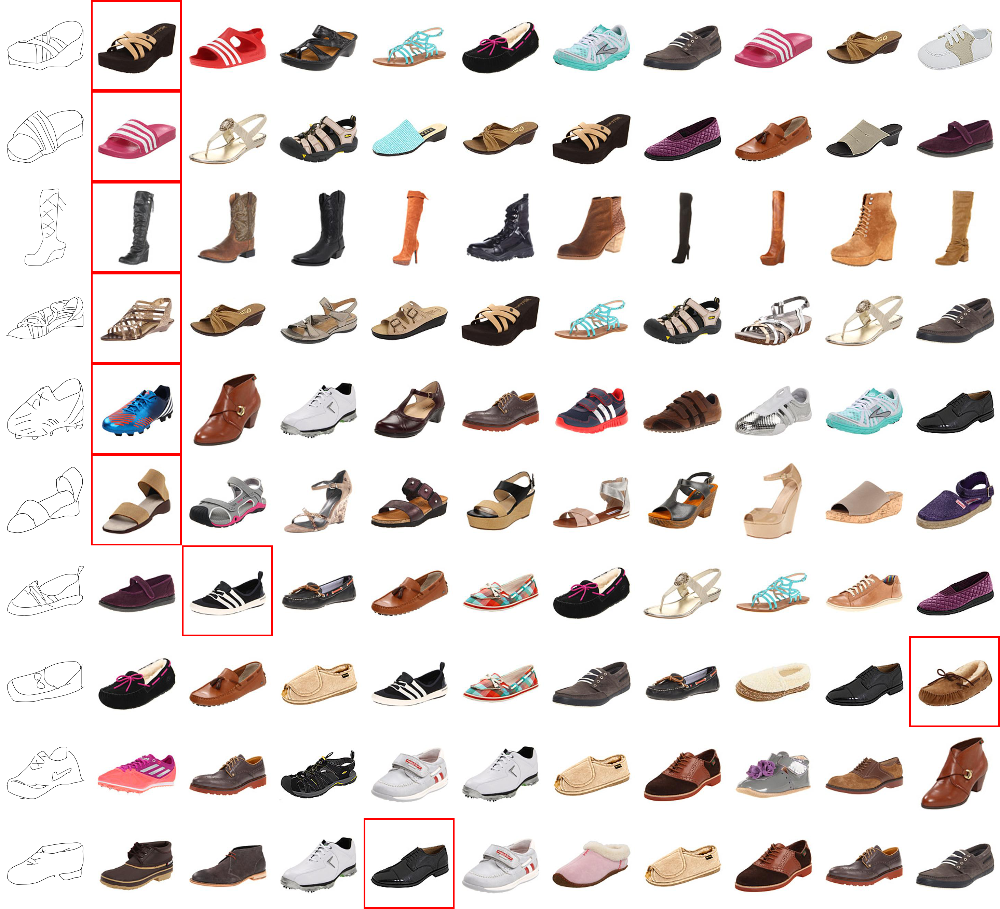

In [27]:
vis_result

In [28]:
vis_result.save('./results/quml_shoev1_latest.png')

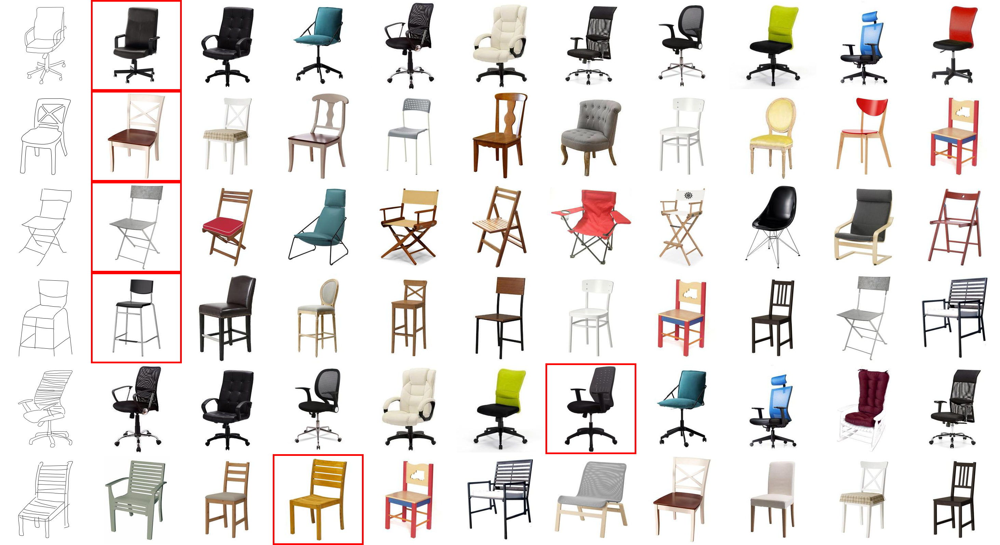

In [33]:
vis_result

In [35]:
vis_result.save('quml_char_result_new.png')

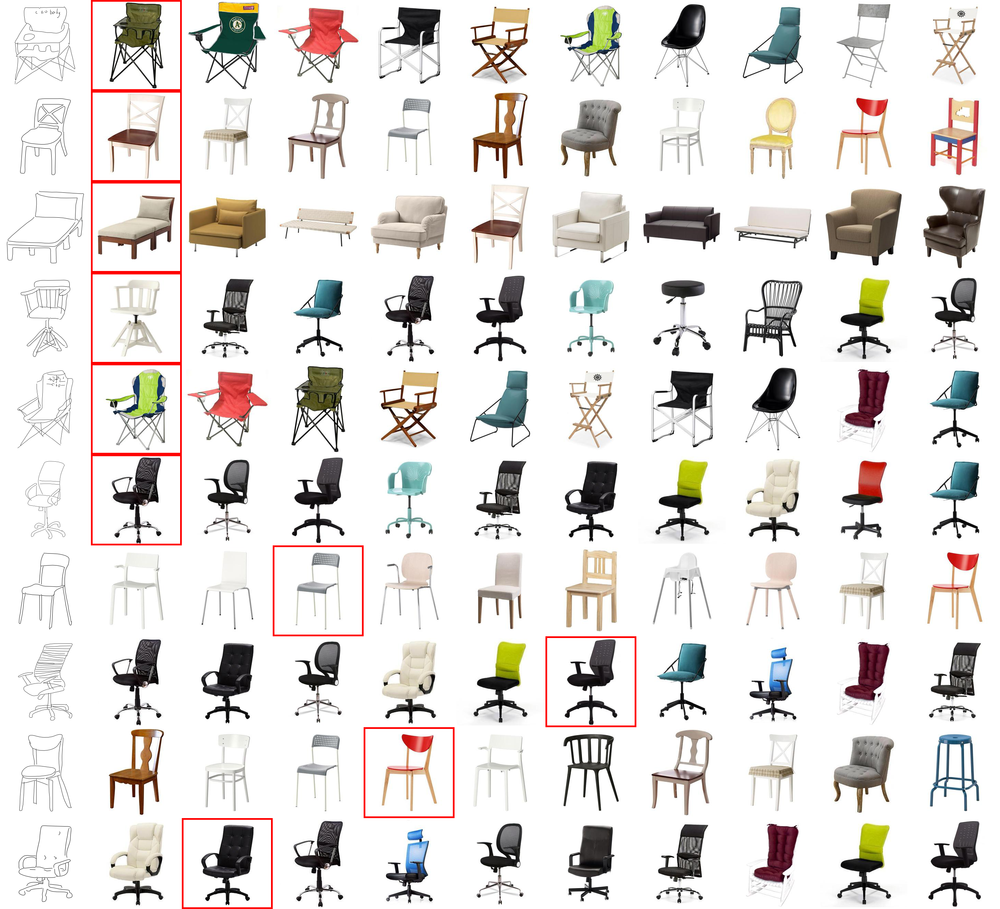

In [57]:
vis_result

In [98]:
vis_result.save('quml_shoev1_latest.png')

In [58]:
vis_result.save('./results/quml_chair_latest.png')